# <center> <span style="color:lightblue">Plotly</span>


In [1]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import seaborn as sns
import cufflinks as cf
import plotly.express as px
%matplotlib inline

In [2]:
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot 
init_notebook_mode(connected=True)
cf.go_offline()

In [3]:
#Basic
arr_1=np.random.randn(50,4)
df_1=pd.DataFrame(arr_1,columns=["A","B","C","D"])
df_1.head()

,A,B,C,D
0,0.090212,-0.752441,0.367471,0.594295
1,0.922973,-1.408109,0.068456,0.693158
2,0.749313,0.880872,-0.642418,0.265120
3,0.181978,0.176739,-1.724320,-0.501271
4,-1.450566,-2.575563,-2.182623,0.141039


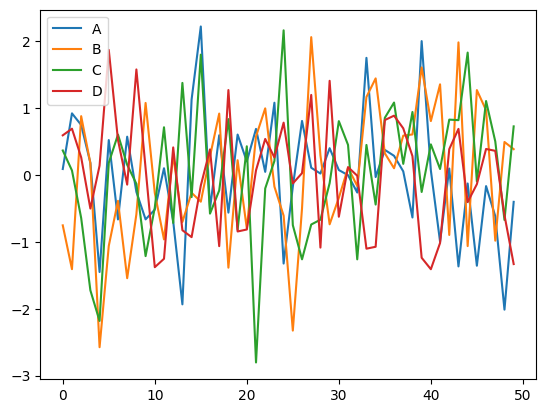

In [4]:
df_1.plot();

In [5]:
df_1.iplot();

In [6]:
#Line Plot
import plotly.graph_objects as go
df_stocks=px.data.stocks()
df_stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [7]:
px.line(df_stocks,x="date",y="GOOG",labels={"x":"Date","y":"Price"})
px.line(df_stocks,x="date",y=["GOOG","AAPL"],labels={"x":"Date","y":"Price"},title="APPLE VS. GOOGLE")
fig=go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.AAPL,mode="lines",name="APPLE"))
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.AMZN,mode="lines+markers",name="Amazon"))
fig.add_trace(go.Scatter(x=df_stocks.date,y=df_stocks.GOOG,mode="lines+markers",name="Google",line=dict(color="firebrick",width=2,dash="dashdot")))
fig.update_layout(title="<b style='color:blue'>Stock Price</b> <br><sup>Date : 2018 - 2020</sup>",xaxis_title="Price",yaxis_title="Date")

In [8]:
#Bar Plot
df_us=px.data.gapminder().query("country=='United States'")
fig=px.bar(df_us,x="year",y="pop",title="<b style='color:blue'>US Population</b> <br><sup>Date : 1950 - 2007</sup>", text=df_us["pop"].apply(lambda x: f'{x/1000000:.1f} M')) #,xaxis_title="Year",yaxis_title="Population"

fig.update_xaxes(tickfont=dict(size=15),title_text="Year")
fig.update_yaxes(tickfont=dict(size=12),title_text="Population")
fig.show()

In [9]:
df_tips=px.data.tips()
px.bar(df_tips,x="day",y="tip",)

In [10]:
np.random.seed(0)
df_sales=pd.DataFrame({"Product Category":["Electronics","Home & Kitchen","Books","Clothing","Beauty & Personal Care","Toys & Games","Grocery","Office Products","Sports & Outdoors","Automotive"],"Sales":np.random.randint(5000,50000,10)})
df_sales.head()

,Product Category,Sales
0,Electronics,7732
1,Home & Kitchen,48567
2,Books,47613
3,Clothing,26243
4,Beauty & Personal Care,35403


In [12]:
df_sales.sort_values("Sales",ascending=False,inplace=True)

#Plot the Data
fig=px.bar(df_sales,x="Product Category",y="Sales",template="simple_white",title="<b>Product Sales 2023</b><br><sup>Sales in KEUR</sup>",text=df_sales["Sales"].apply(lambda x: f'{x/1000:.1f}'))

fig.update_xaxes(tickfont=dict(size=12),title="")
fig.update_yaxes(tickfont=dict(size=12),title="")

highlighted_bar="Clothing"

fig.update_traces(marker_color=["blue" if x==highlighted_bar else "grey" for x in df_sales["Product Category"]],textposition="inside" )

# find the sales value for "Clothing"
highlighted_bar_sales=df_sales.loc[df_sales["Product Category"]==highlighted_bar,"Sales"].values[0]

# Add annotation for the highlighted bar

fig.add_annotation(x=highlighted_bar,y=highlighted_bar_sales,text="New Release",showarrow=True,font=dict(size=12,color="black"), bgcolor="white",opacity=0.8)
fig.show()



In [13]:
x=np.random.randn(2000)
y=np.random.randn(2000)
iplot([go.Histogram2dContour(x=x,y=y,contours=dict(coloring="heatmap")),go.Scatter(x=x,y=y,mode="markers",marker=dict(color="white",size=3,opacity=0.3))],show_link=False)

In [15]:
import plotly.figure_factory as ff
df_bar_pubg=pd.read_csv("P48-Custom-Data-PUBG.csv")
x= df_bar_pubg["solo_Wins"]
y=df_bar_pubg["solo_TimeSurvived"]

colorscale=["#7A4579","#d56073","rgb(236,158,105)",(1,1,0.2),(0.98,0.98,0.98)]

fig = ff.create_2d_density(x,y,colorscale=colorscale,hist_color="rgb(255,237,222)",point_size=3)

iplot(fig,filename="histogram_subplots")
